In [1]:
from Yugiquery import *
header('Sets')

<div align='center'>
    <br>
    <!-- Pre Style needed to fix HTML formatting -->
    <pre style="line-height: var(--jp-code-line-height); font-family: var(--jp-code-font-family)">
    ██    ██ ██    ██  ██████  ██  ██████  ██    ██ ███████ ██████  ██    ██ 
     ██  ██  ██    ██ ██       ██ ██    ██ ██    ██ ██      ██   ██  ██  ██  
      ████   ██    ██ ██   ███ ██ ██    ██ ██    ██ █████   ██████    ████   
       ██    ██    ██ ██    ██ ██ ██ ▄▄ ██ ██    ██ ██      ██   ██    ██    
       ██     ██████   ██████  ██  ██████   ██████  ███████ ██   ██    ██    
                                      ▀▀                                     
    </pre>
</div>
<div align='right'>
    Sets - Last modified: 02/01/2023 13:18 UTC <br>
    By <b>Guilherme Ruiz</b>
</div>

Table of Contents
=================

*   [1  Data aquisition](#Data-aquisition)
    *   [1.1  Fetch online data](#Fetch-online-data)
    *   [1.2  Format data](#Format-data)
    *   [1.3  Save data](#Save-data)
*   [2  Check changes](#Check-changes)
    *   [2.1  Load latest file](#Load-latest-file)
    *   [2.2  Generate changelog](#Generate-changelog)
*   [3  Data visualization](#Data-visualization)
    *   [3.1  Full data](#Full-data)
*   [4  HTML export](#HTML-export)
*   [5  Git](#Git)

# Data aquisition

## Get set lists

In [2]:
timestamp = pd.Timestamp.now().timestamp()

# Get list of sets
df = pd.read_json(f'{api_url}{sets_query_url}')
keys = list(df['query']['results'].keys())

# Get set lists
all_set_lists_df = pd.DataFrame(columns = ['Set','Card number','Name','Rarity','Print','Quantity','Region'])
step = 50

total_success = 0
total_error = 0

for i in range(np.ceil(len(keys)/step).astype(int)):
    success = 0
    error = 0
    print(f'Iteration {i}:')
        
    first = i*step
    last = (i+1)*step
    titles = up.quote('|'.join(keys[first:last]))
    df = pd.read_json(f'{api_url}{lists_query_url}{titles}')
    contents = df['query']['pages'].values()
    
    for content in contents:
        if 'revisions' in  content.keys():
            temp = content['revisions'][0]['*']
            parsed = wtp.parse(temp)
            
            for template in parsed.templates:
                if template.name == 'Set list':
                    title = content['title'].split('Lists:')[1]
                    set_df = pd.DataFrame(columns = ['Set', 'Card number', 'Name', 'Rarity', 'Print', 'Quantity'])

                    region = None
                    rarity = None
                    card_print = None
                    qty = None
                    desc = None
                    opt = None
                    list_df = None
                    
                    for argument in template.arguments:
                        if 'region=' in argument:
                            region = argument.string[argument.string.index('=')+1:]
                        elif 'rarities=' in argument:
                            rarity = tuple(rarity_dict.get(i.strip().lower(), string.capwords(i.strip())) for i in argument.string[argument.string.index('=')+1:].split(','))
                        elif 'print=' in argument:
                            card_print = argument.string[argument.string.index('=')+1:]
                        elif 'qty=' in argument:
                            qty = argument.string[argument.string.index('=')+1:]
                        elif 'description=' in argument:
                            desc = argument.string[argument.string.index('=')+1:]
                        elif 'options=' in argument:
                            opt = argument.string[argument.string.index('=')+1:]
                        else:
                            set_list = argument.string[2:-1]
                            lines = set_list.split('\n')

                            list_df = pd.DataFrame([x.split(';') for x in lines])
                            list_df = list_df[~list_df[0].str.contains('!:')]
                            list_df = list_df.applymap(lambda x: x.split('//')[0] if x is not None else x)
                            list_df = list_df.applymap(lambda x: x.strip() if x is not None else x)
                            list_df.replace(r'^\s*$', None, regex = True, inplace = True)

                    if opt != 'noabbr':
                        set_df['Card number'] = list_df[0]
                        set_df['Name'] = list_df[1]
                    else: 
                        set_df['Name'] = list_df[0]

                    if len(list_df.columns)>2: # and rare in str
                        set_df['Rarity'] = list_df[2].apply(lambda x: tuple([rarity_dict.get(y.strip().lower(), string.capwords(y.strip())) for y in x.split(',')]) if x is not None else rarity)
                    else:
                        set_df['Rarity'] = [rarity for _ in set_df.index]

                    if len(list_df.columns)>3 :
                        if card_print is not None: # and new/reprint in str
                            set_df['Print'] = list_df[3].apply(lambda x: x if x is not None else card_print)
                            if len(list_df.columns)>4 and qty is not None:
                                set_df['Quantity'] = list_df[4].apply(lambda x: x if x is not None else qty)
                        elif qty is not None:
                            set_df['Quantity'] = list_df[3].apply(lambda x: x if x is not None else qty)
                    
                    set_df['Name'] = set_df['Name'].apply(lambda x: x.strip('\u200e').split(' (')[0] if x is not None else x)
                    set_df['Set'] = title.split("(")[0].strip()
                    set_df['Quantity'] = pd.to_numeric(set_df['Quantity'])
                    set_df['Region'] = region.upper()
                    all_set_lists_df = pd.concat([all_set_lists_df, set_df], ignore_index=True)
                    success+=1
                    
        else:
            print(f"Error! No content for \"{content['title']}\"")
            error+=1
    
    total_success+=success
    total_error+=error
    print(f'{success} set lists downloaded - {error} errors')
    print('-------------------------------------------------')

all_set_lists_df = all_set_lists_df.convert_dtypes()
all_set_lists_df.sort_values(by=['Set','Region','Card number']).reset_index(inplace = True)
print(f'Total: {total_success} set lists downloaded - {total_error} errors')

Iteration 0:
Error! No content for "Set Card Lists:All Effect Monsters (WC6-EN)"
Error! No content for "Set Card Lists:Invasion: Vengeance: Special Edition (TCG-PT)"
Error! No content for "Set Card Lists:Sneak Peek Participation Cards: Series 5 (TCG-IT)"
47 set lists downloaded - 3 errors
-------------------------------------------------
Iteration 1:
Error! No content for "Set Card Lists:Invasion: Vengeance: Special Edition (TCG-EN)"
Error! No content for "Set Card Lists:Sneak Peek Participation Cards: Series 5 (TCG-DE)"
49 set lists downloaded - 2 errors
-------------------------------------------------
Iteration 2:
Error! No content for "Set Card Lists:Invasion: Vengeance: Special Edition (TCG-SP)"
Error! No content for "Set Card Lists:Sneak Peek Participation Cards: Series 4 (TCG-FR)"
49 set lists downloaded - 2 errors
-------------------------------------------------
Iteration 3:
Error! No content for "Set Card Lists:Yu-Gi-Oh! World Championship 2007 Game Guide promotional card (OC

## Get set properties

In [3]:
# Info to ask
info = ['Series','Set type','Cover card','Modification date']
# Release to ask
release = [i+' release date' for i in set(regions_dict.values())]
# Ask list
ask = up.quote('|'.join(np.append(info,release)))
# First column with timestamp
first_tuple = info.index('Cover card')
first_timestamp = info.index('Modification date')
# List of sets to ask
sets = all_set_lists_df['Set'].unique()
step = 15

# Get set info
set_info_df = pd.DataFrame()
for i in range(np.ceil(len(sets)/step).astype(int)):
    print(f'Iteration {i}')
    first = i*step
    last = (i+1)*step
    titles = up.quote(']]OR[['.join(sets[first:last]))
    response = pd.read_json(f'{api_url}?action=askargs&conditions={titles}&printouts={ask}&format=json')
    printouts = extract_results(response)
    printouts.iloc[:, :first_tuple] = printouts.iloc[:, :first_tuple].applymap(lambda x: x[0]['fulltext'] if len(x)>0 else np.nan)
    printouts.iloc[:, first_tuple:first_timestamp] = printouts.iloc[:, first_tuple:first_timestamp].applymap(lambda x: tuple([y['fulltext'] for y in x]) if len(x)>0 else np.nan)
    printouts.iloc[:, first_timestamp:] = printouts.iloc[:, first_timestamp:].applymap(lambda x: pd.to_datetime(x[0]['timestamp'], unit = 's', errors = 'coerce') if len(x)>0 else np.nan)
    set_info_df = pd.concat([set_info_df, printouts])
    print(f'{len(printouts)} set properties downloaded - {step-len(printouts)} errors')

set_info_df = set_info_df.convert_dtypes()
set_info_df.sort_index(inplace = True)
print(f'{len(set_info_df)} set properties downloaded - {step*(i+1)-len(set_info_df)} errors')

Iteration 0
15 set properties downloaded - 0 errors
Iteration 1
15 set properties downloaded - 0 errors
Iteration 2
15 set properties downloaded - 0 errors
Iteration 3
15 set properties downloaded - 0 errors
Iteration 4
15 set properties downloaded - 0 errors
Iteration 5
15 set properties downloaded - 0 errors
Iteration 6
15 set properties downloaded - 0 errors
Iteration 7
15 set properties downloaded - 0 errors
Iteration 8
15 set properties downloaded - 0 errors
Iteration 9
15 set properties downloaded - 0 errors
Iteration 10
15 set properties downloaded - 0 errors
Iteration 11
15 set properties downloaded - 0 errors
Iteration 12
15 set properties downloaded - 0 errors
Iteration 13
15 set properties downloaded - 0 errors
Iteration 14
14 set properties downloaded - 1 errors
Iteration 15
15 set properties downloaded - 0 errors
Iteration 16
15 set properties downloaded - 0 errors
Iteration 17
15 set properties downloaded - 0 errors
Iteration 18
15 set properties downloaded - 0 errors
Ite

# Format data

## Add properties to set lists

In [4]:
all_set_lists_df['Release'] = all_set_lists_df[['Set','Region']].apply(lambda x: set_info_df[regions_dict[x['Region']]+' release date'][x['Set']] if (x['Region'] in regions_dict.keys() and x['Set'] in set_info_df.index) else None, axis = 1)
all_set_lists_df['Release'] = pd.to_datetime(all_set_lists_df['Release'].astype(str), errors='coerce') # Bug fix
all_set_lists_df = all_set_lists_df.merge(set_info_df.iloc[:,:first_timestamp+1], left_on = 'Set', right_index = True, how = 'outer', indicator = True).reset_index(drop=True)
print('Set properties merged to set lists')

Set properties merged to set lists


## Save data

In [5]:
all_set_lists_df.drop('_merge', axis=1).to_csv(f'../Data/All_sets_{int(timestamp)}.csv', index = False)
print('Data saved')

Data saved


# Check changes

## Load previous data

In [6]:
# Get list of files
files_list = sorted(glob.glob('../Data/All_sets_*.csv'), key=os.path.getctime, reverse=True)
# Get second newest file if exist
if len(files_list)>1:
    # Load csv avoiding converting "NA" to NaN and force dtypes to match current df
    previous_df = pd.read_csv(files_list[1], dtype=object, keep_default_na=False, na_values=[''])
    # Correct tuples
    previous_df['Rarity'] = previous_df['Rarity'].dropna().apply(literal_eval)
    previous_df['Cover card'] = previous_df['Cover card'].dropna().apply(literal_eval)
    # Force dtypes to match current df
    previous_df = previous_df.astype(all_set_lists_df.drop('_merge', axis = 1).dtypes.to_dict())
    print('File loaded')
else:
    previous_df = None
    print('No older files')

File loaded


## Generate changelog

In [7]:
if previous_df is None:
    print('Skipped')
else:
    changelog = generate_changelog(previous_df, all_set_lists_df.drop('_merge', axis=1), col = 'Card number')
    if not changelog.empty:
        display(changelog)
        changelog.to_csv(f'../Data/Sets_changelog_{int(timestamp)}.csv', index = False)
        print('Changelog saved')

,Print,Version
Card number,,
CL03-SC004,<NA>,Old
CL03-SC004,,New
CL03-SC005,,New
CL03-SC005,<NA>,Old
CL03-SC006,<NA>,Old
...,...,...
CL03-SC188,<NA>,Old
CL03-SC189,,New
CL03-SC189,<NA>,Old


Changelog saved


# Data visualization

## Full data

In [8]:
all_set_lists_df

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
0,Abyss Rising Sneak Peek Participation Card,ABYR-ENSP1,Ignoble Knight of Black Laundsallyn,"(Ultra Rare,)",<NA>,<NA>,EN,2012-11-03,Sneak Peek Participation Cards,Participation card,NaN,2021-04-17 12:10:57,both
1,Abyss Rising Sneak Peek Participation Card,ABYR-FRSP1,Ignoble Knight of Black Laundsallyn,"(Ultra Rare,)",<NA>,<NA>,FR,2012-11-03,Sneak Peek Participation Cards,Participation card,NaN,2021-04-17 12:10:57,both
2,Abyss Rising Sneak Peek Participation Card,ABYR-DESP1,Ignoble Knight of Black Laundsallyn,"(Ultra Rare,)",<NA>,<NA>,DE,2012-11-03,Sneak Peek Participation Cards,Participation card,NaN,2021-04-17 12:10:57,both
3,Abyss Rising Sneak Peek Participation Card,ABYR-SPSP1,Ignoble Knight of Black Laundsallyn,"(Ultra Rare,)",<NA>,<NA>,SP,2012-11-03,Sneak Peek Participation Cards,Participation card,NaN,2021-04-17 12:10:57,both
4,Abyss Rising Sneak Peek Participation Card,ABYR-ITSP1,Ignoble Knight of Black Laundsallyn,"(Ultra Rare,)",<NA>,<NA>,IT,2012-11-03,Sneak Peek Participation Cards,Participation card,NaN,2021-04-17 12:10:57,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
155815,Jump Festa 2013 - Promotion Pack A,JF13-JPA08,Fishborg Archer,"(Normal Parallel Rare,)",New,<NA>,JP,2012-12-22,<NA>,Booster pack,NaN,2022-07-26 20:28:03,both
155816,Jump Festa 2013 - Promotion Pack A,JF13-JPA09,Vulcan the Divine,"(Normal Parallel Rare,)",New,<NA>,JP,2012-12-22,<NA>,Booster pack,NaN,2022-07-26 20:28:03,both
155817,Jump Festa 2013 - Promotion Pack A,JF13-JPA10,Secret Sanctuary of the Spellcasters,"(Normal Parallel Rare,)",New,<NA>,JP,2012-12-22,<NA>,Booster pack,NaN,2022-07-26 20:28:03,both
155818,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only


Full data available [here](../Data)

## By Set

In [9]:
print('Total number of sets:', all_set_lists_df['Set'].nunique())

Total number of sets: 1438


In [10]:
all_set_lists_df.groupby('Set', dropna=False).nunique()

,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Set,,,,,,,,,,,,
"""Amabie-San"" Present Campaign",2,1,1,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon Rush Rare Special Red Version"" GET Campaign",2,1,1,0,0,2,2,0,1,0,1,1
"""Blue-Eyes White Dragon Secret Rare Special Blue Version"" GET Campaign",1,1,1,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon"" 20th Anniversary Gold Edition",0,1,0,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon"" 20th Anniversary Silver Edition",0,1,0,0,0,1,1,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Yu-Gi-Oh! ZEXAL World Duel Carnival Duel Champion Guide! promotional card,1,1,1,0,0,1,1,0,1,0,1,1
Yu-Gi-Oh! ZEXAL World Duel Carnival promotional cards,18,3,1,0,0,6,2,0,1,0,1,1
Yugi's Legendary Decks,650,112,3,0,0,5,2,0,1,0,1,1


In [11]:
all_set_lists_df.groupby('Set', dropna=False).nunique().describe()

,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
count,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.0
mean,106.747566,27.402643,2.423505,0.349096,0.099444,2.689847,1.440195,0.389430,0.953408,0.310153,0.994437,1.0
std,235.792582,45.287913,2.325180,0.813403,0.455981,2.296964,0.949071,0.487791,0.210838,0.462717,0.074406,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.0
50%,10.000000,5.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.0
75%,86.000000,40.000000,3.000000,0.000000,0.000000,5.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.0
max,1652.000000,307.000000,17.000000,6.000000,3.000000,10.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.0


## By Card number

In [12]:
print('Total number of card numbers:', all_set_lists_df['Card number'].nunique())

Total number of card numbers: 151655


In [13]:
all_set_lists_df.groupby('Card number', dropna=False).nunique()

,Set,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Card number,,,,,,,,,,,,
15AX-JP000,2,1,1,1,0,1,1,0,1,0,2,1
15AX-JPM01,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM02,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM03,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM04,1,1,1,1,0,1,1,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
ZTIN-SP021,1,1,1,0,0,1,1,0,1,1,1,1
ZTIN-SPV01,1,1,1,0,0,1,1,0,1,1,1,1
ZTIN-SPV02,1,1,1,0,0,1,1,0,1,1,1,1


## By Name

In [14]:
print('Total number of card names:', all_set_lists_df['Name'].nunique())

Total number of card names: 12518


In [15]:
all_set_lists_df.groupby('Name', dropna=False).nunique()

,Set,Card number,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Name,,,,,,,,,,,,
"""A Legendary Ocean""",1,1,0,0,0,1,1,0,1,1,1,1
"""A"" Cell Breeding Device",4,9,1,1,0,7,6,1,2,3,4,1
"""A"" Cell Incubator",2,8,1,2,0,7,6,1,1,2,2,1
"""A"" Cell Recombination Device",1,8,1,0,0,8,4,1,1,1,1,1
"""A"" Cell Scatter Burst",3,9,1,1,0,7,6,1,1,3,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Zubaba Knight,12,50,5,1,1,8,23,2,2,7,12,1
Zubababancho Gagagacoat,1,2,1,1,0,2,2,1,1,1,1,1
"Zure, Knight of Dark World",8,24,1,1,1,10,14,1,4,4,8,1


In [16]:
all_set_lists_df.groupby('Name', dropna=True).nunique().describe()

,Set,Card number,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
count,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000,12518.000000
mean,3.147867,12.090989,2.069740,0.673270,0.112877,6.897268,5.941045,1.087474,1.475555,1.846621,3.136523,1.010864
std,3.522276,11.607222,1.499384,0.672784,0.343104,2.559102,5.716914,0.788145,0.939745,1.843773,3.501625,0.103669
min,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.000000,7.000000,1.000000,0.000000,0.000000,6.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,2.000000,9.000000,2.000000,1.000000,0.000000,8.000000,4.000000,1.000000,1.000000,1.000000,2.000000,1.000000
75%,4.000000,14.000000,3.000000,1.000000,0.000000,8.000000,7.000000,1.000000,2.000000,2.000000,4.000000,1.000000
max,80.000000,275.000000,28.000000,4.000000,3.000000,15.000000,116.000000,12.000000,16.000000,41.000000,80.000000,2.000000


## By Rarity

In [17]:
print('Total number of rarities:', all_set_lists_df['Rarity'].explode().nunique())

Total number of rarities: 54


### By unique

In [18]:
all_set_lists_df.explode('Rarity').groupby('Rarity', dropna = False).nunique()

,Set,Card number,Name,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Rarity,,,,,,,,,,,,
10000 Secret Rare,2,7,1,1,0,7,2,1,1,2,2,1
20th Secret Rare,16,135,134,3,0,1,13,3,3,6,16,1
@released::(from July 17),1,1,1,0,0,1,0,0,0,0,1,1
@released::(from July 31),1,1,1,0,0,1,0,0,0,0,1,1
@released::(from September 18),1,2,1,0,0,1,0,0,0,0,1,1
Collector's Rare,5,211,61,2,0,7,5,2,1,5,5,1
Collectors Rare,8,112,112,2,0,1,8,1,1,7,8,1
Common,560,76802,8506,6,3,17,921,25,23,268,558,2
Duel Terminal Normal Parallel Rare,38,1906,511,2,0,7,34,1,3,11,38,1


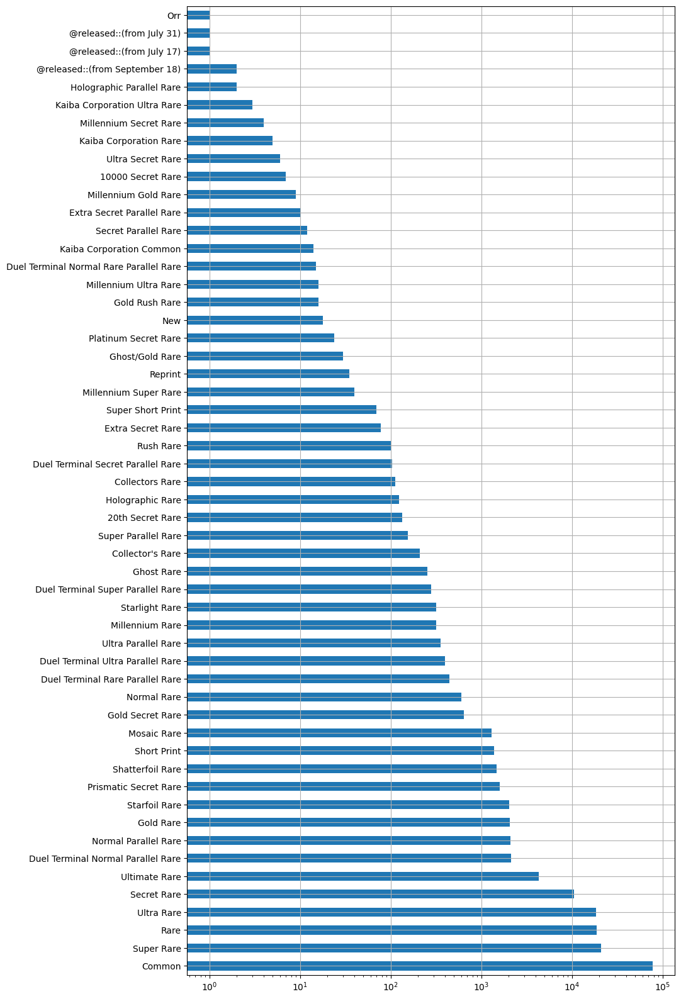

In [19]:
all_set_lists_df['Rarity'].explode().value_counts().plot.barh(figsize = (10,20), grid=True)
plt.xscale('log')
plt.show()

### By combination

In [20]:
all_set_lists_df.groupby('Rarity', dropna = False).nunique()

,Set,Card number,Name,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Rarity,,,,,,,,,,,,
"(10000 Secret Rare,)",2,7,1,1,0,7,2,1,1,2,2,1
"(20th Secret Rare,)",9,25,24,1,0,1,8,2,3,1,9,1
"(@released::(from July 17),)",1,1,1,0,0,1,0,0,0,0,1,1
"(@released::(from July 31),)",1,1,1,0,0,1,0,0,0,0,1,1
"(@released::(from September 18),)",1,2,1,0,0,1,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
"(Ultra Rare, Ultimate Rare, Ultra Parallel Rare)",1,1,1,0,0,1,1,1,1,1,1,1
"(Ultra Rare, Ultra Parallel Rare)",22,71,67,0,0,1,16,3,2,16,21,2
"(Ultra Rare, Ultra Parallel Rare, Ultimate Rare)",5,5,5,0,0,1,3,2,1,3,5,1


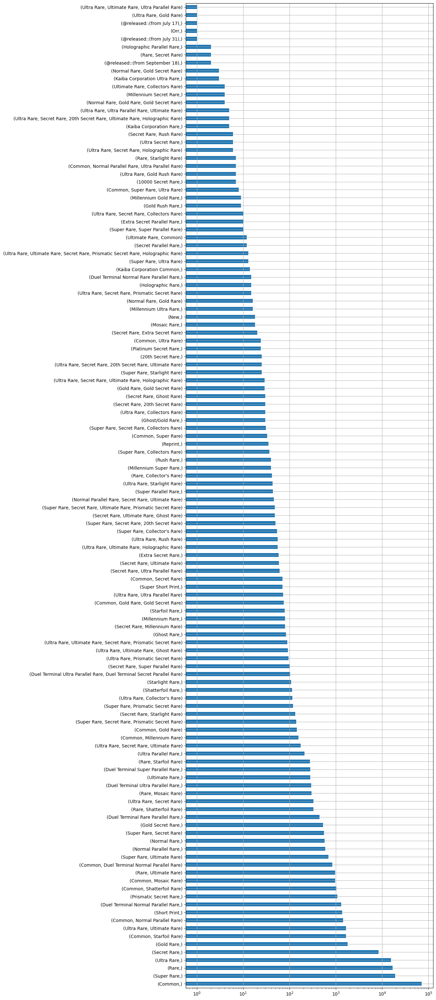

In [21]:
all_set_lists_df['Rarity'].value_counts().plot.barh(figsize = (10,40), grid=True)
plt.xscale('log')
plt.show()

## By Print

In [22]:
print('Total number of prints:', all_set_lists_df['Print'].nunique())

Total number of prints: 18


In [23]:
all_set_lists_df.groupby('Print', dropna=False).nunique()

,Set,Card number,Name,Rarity,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Print,,,,,,,,,,,,
,1,175,0,0,0,1,1,1,1,0,1,1
2,1,0,1,0,0,1,1,0,1,1,1,1
American debut,1,3,3,1,0,1,1,0,1,1,1,1
European & Oceanian debut,1,6,6,1,0,1,1,0,1,0,1,1
European debut,12,146,146,5,0,2,10,0,2,1,12,1
Functional errata,1,2,2,1,0,1,1,0,1,1,1,1
New,226,11518,3858,50,3,11,242,18,13,129,224,2
New art,1,4,2,1,0,2,2,0,1,1,1,1
New artwork,10,74,15,5,0,7,12,3,4,4,10,1


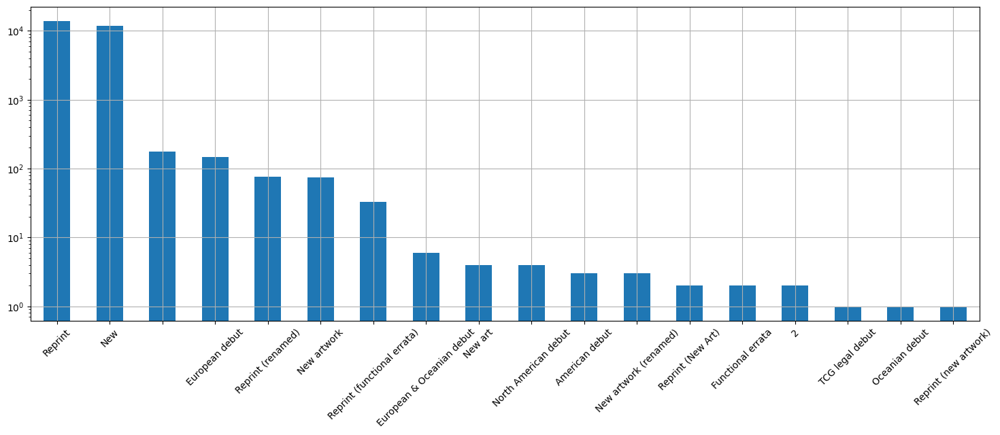

In [24]:
all_set_lists_df['Print'].value_counts().plot.bar(figsize = (18,6), grid=True, rot = 45)
plt.yscale('log')
plt.show()

## By Quantity

In [25]:
print('Total number of quantities:', all_set_lists_df['Quantity'].nunique())

Total number of quantities: 3


In [26]:
all_set_lists_df.groupby('Quantity', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Region,Release,Series,Set type,Cover card,Modification date,_merge
Quantity,,,,,,,,,,,,
1,67,8858,1215,11,2,11,108,1,6,46,66,2
2,66,855,173,4,2,11,108,1,6,45,65,2
3,10,74,25,1,2,8,12,0,4,8,10,1
<NA>,1373,141880,12409,123,18,17,1499,45,36,314,1365,3


## By Region

In [27]:
print('Total number of regions:', all_set_lists_df['Region'].nunique())

Total number of regions: 17


In [28]:
all_set_lists_df.groupby('Region', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Release,Series,Set type,Cover card,Modification date,_merge
Region,,,,,,,,,,,,
AE,34,1527,1493,12,0,2,31,2,7,19,34,1
AU,2,100,87,3,0,0,0,0,1,2,2,1
DE,454,20312,10354,45,4,3,382,12,18,218,453,2
EN,657,20183,10444,51,14,3,535,22,23,207,656,2
ES,1,100,100,7,0,0,0,1,1,1,1,1
EU,25,543,456,8,3,0,15,2,9,6,25,1
FC,3,102,87,3,0,0,1,0,2,2,3,1
FR,448,19719,10341,46,4,3,376,14,18,218,447,2
IT,446,19991,10349,46,4,3,377,12,18,217,445,2


In [29]:
all_set_lists_df.groupby('Region', dropna=False).nunique().describe()

,Set,Card number,Name,Rarity,Print,Quantity,Release,Series,Set type,Cover card,Modification date,_merge
count,18.000000,18.000000,18.000000,18.00000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,215.000000,8459.388889,4796.666667,27.50000,3.055556,1.666667,176.055556,7.777778,10.166667,95.111111,214.166667,1.388889
std,252.611303,9271.039450,4996.845158,25.53717,3.489012,1.414214,203.698010,8.156957,8.759868,105.433497,251.520611,0.501631
min,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,4.000000,213.750000,210.250000,8.00000,0.000000,0.000000,3.500000,2.000000,2.000000,3.000000,4.000000,1.000000
50%,40.500000,1526.500000,1413.000000,12.00000,3.500000,2.000000,35.000000,5.000000,9.500000,15.500000,40.500000,1.000000
75%,438.250000,19105.000000,10347.000000,45.75000,4.000000,3.000000,370.750000,12.000000,17.750000,214.500000,437.250000,2.000000
max,718.000000,20312.000000,11156.000000,92.00000,14.000000,3.000000,535.000000,28.000000,28.000000,247.000000,713.000000,2.000000


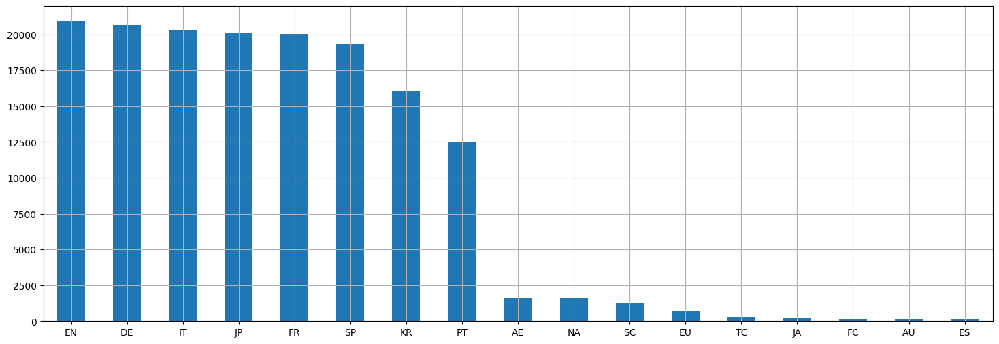

In [30]:
all_set_lists_df['Region'].value_counts().plot.bar(figsize = (18,6), grid=True, rot=0)
plt.show()

## By Cover card

In [31]:
print('Total number of cover cards:', all_set_lists_df['Cover card'].explode('Cover card').nunique())

Total number of cover cards: 671


In [32]:
all_set_lists_df.explode('Cover card').groupby('Cover card').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Modification date,_merge
Cover card,,,,,,,,,,,,
A-to-Z-Dragon Buster Cannon,1,352,54,4,2,2,8,4,0,1,1,1
Accel Synchro Stardust Dragon,1,100,50,3,2,0,2,2,0,1,1,1
Accesscode Talker,1,766,101,16,2,0,8,3,1,1,1,1
Adamancipator Risen - Dragite,1,135,45,3,2,0,3,3,0,1,1,1
"Adreus, Keeper of Armageddon",1,84,42,4,0,0,2,2,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Yamiterasu the Divine Delayer,1,132,66,6,0,0,2,2,1,1,1,1
"Yoko, the Graceful Mayakashi",2,450,60,4,2,0,8,3,0,1,2,1
Yubel - The Ultimate Nightmare,2,560,100,10,0,0,6,5,1,2,2,1


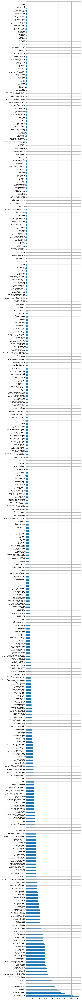

In [33]:
all_set_lists_df['Cover card'].explode().value_counts().plot.barh(figsize = (10,180), grid=True)
plt.show()

## By series

In [34]:
print('Total number of series:', all_set_lists_df['Series'].nunique())

Total number of series: 45


In [35]:
all_set_lists_df.groupby('Series').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Set type,Cover card,Modification date,_merge
Series,,,,,,,,,,,,
+1 Bonus Pack,6,230,118,3,0,0,2,11,1,0,6,1
Animation Chronicle,2,200,100,7,2,0,2,4,1,2,2,1
Astral Pack,7,1110,184,4,4,0,6,16,1,0,7,1
Attribute Duelist Pack,4,429,199,6,3,0,3,9,1,4,4,1
Battle Pack (Rush Duel),8,80,80,3,3,0,1,8,1,0,8,1
Booster (series),4,181,176,8,0,0,1,4,1,2,4,1
Booster pack,1,50,50,3,0,0,1,1,1,0,1,1
Champion Pack,8,640,161,4,2,0,4,8,1,0,8,1
Classic Pack,3,570,395,9,3,0,1,3,1,2,3,1


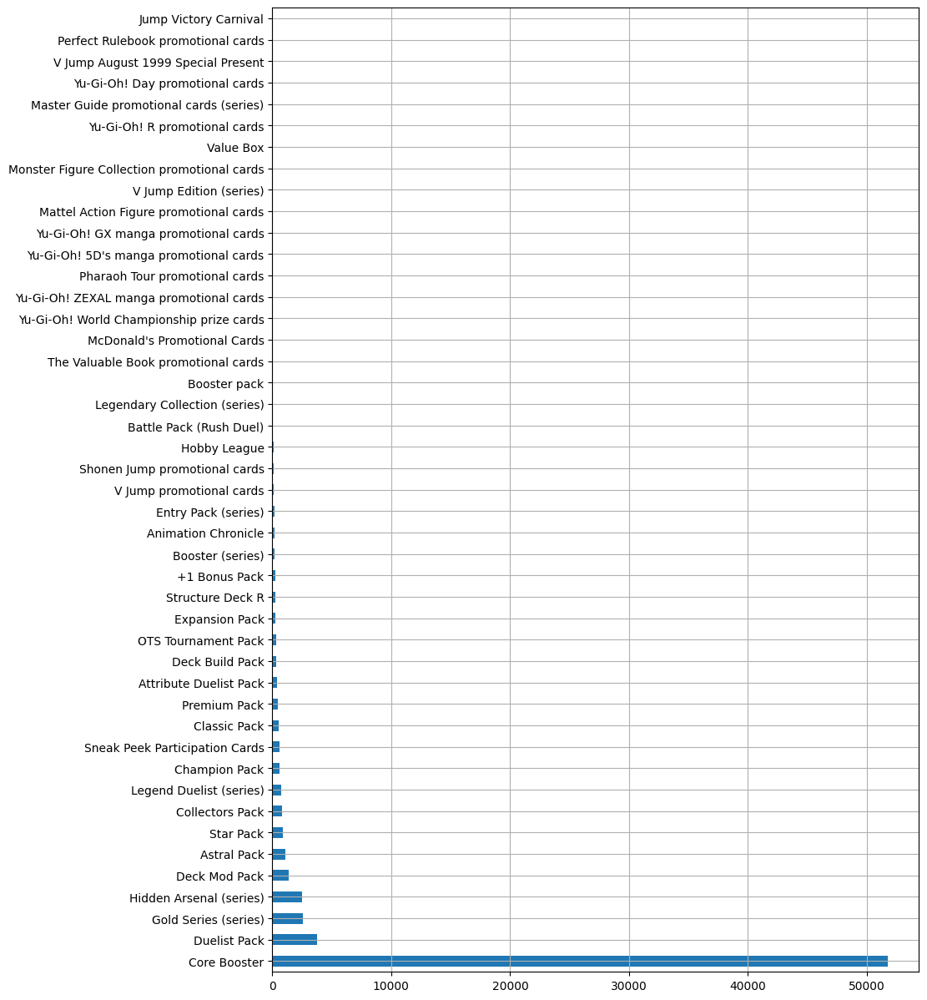

In [36]:
all_set_lists_df['Series'].value_counts().plot.barh(figsize = (10,15), grid=True)
plt.show()

## By set type

In [37]:
print('Total number of set types:', all_set_lists_df['Set type'].nunique())

Total number of set types: 37


In [38]:
all_set_lists_df.groupby('Set type').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Cover card,Modification date,_merge
Set type,,,,,,,,,,,,
Beta set,1,535,106,1,0,2,5,1,0,0,1,1
Binder,2,6,6,2,2,0,1,2,0,0,2,1
Book promotional card,4,5,5,3,0,0,2,4,1,0,4,1
Book promotional cards,26,52,52,4,0,0,2,27,2,0,26,1
Booster pack,469,113674,11696,102,16,0,15,808,23,223,469,1
Boss Duel Deck,1,8,8,1,0,0,1,1,0,0,1,1
Bundle,9,11,11,3,0,0,1,7,1,0,9,1
Collectible tin,53,5901,1005,9,4,0,8,66,0,35,53,1
Collector's Set,11,6226,1102,7,2,3,7,14,0,6,11,1


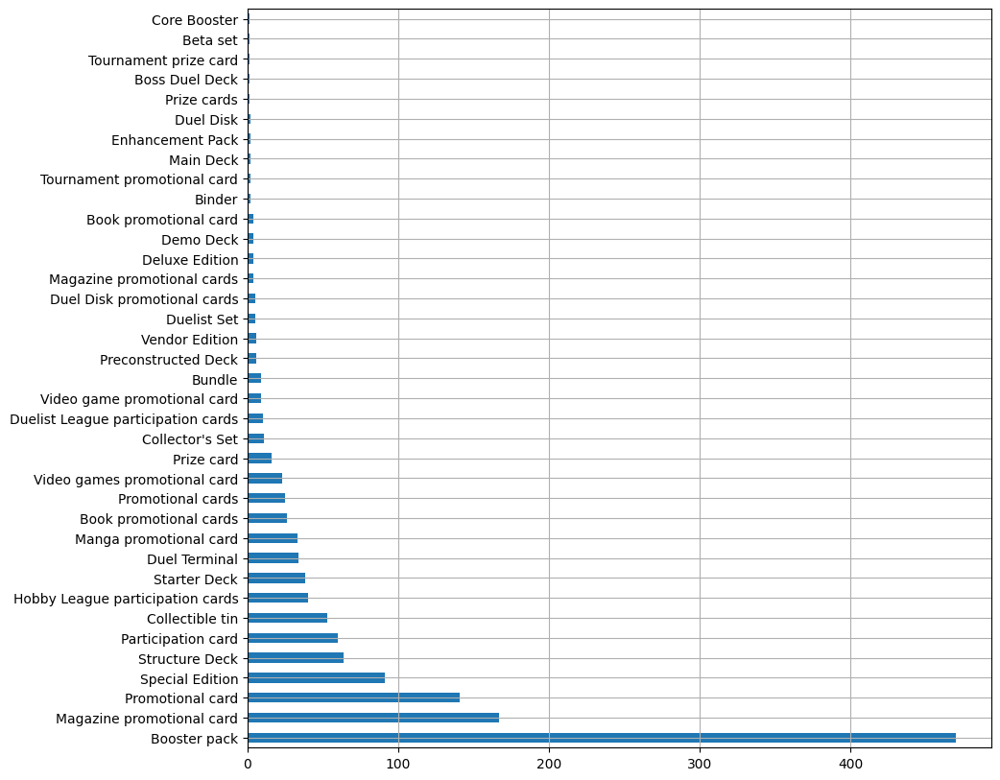

In [39]:
set_info_df['Set type'].value_counts().plot.barh(figsize = (10,10), grid=True)
plt.show()

## By Release

In [40]:
print('Total number of release dates:', all_set_lists_df['Release'].nunique())

Total number of release dates: 1570


In [41]:
all_set_lists_df.groupby('Release', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Series,Set type,Cover card,Modification date,_merge
Release,,,,,,,,,,,,
1999-03-01,1,0,40,1,0,0,1,1,1,0,1,1
1999-03-18,1,0,1,0,0,0,1,0,1,0,1,1
1999-04-29,1,0,1,0,0,0,1,0,1,0,1,1
1999-05-05,1,0,1,0,0,0,1,0,1,0,1,1
1999-05-25,1,0,40,1,0,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-21,1,68,36,7,0,0,1,1,1,1,1,1
2023-02-25,1,190,15,5,3,0,1,1,1,0,1,1
2023-03-01,3,2,3,2,0,0,1,0,1,0,3,1


In [42]:
set_by_release = pd.DataFrame(all_set_lists_df.groupby('Release', dropna=False)['Set'].nunique())

### By year

In [43]:
all_set_lists_df.drop('Modification date', axis=1).groupby('Release', dropna=False).nunique().groupby(set_by_release.index.strftime('%Y')).sum()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Series,Set type,Cover card,_merge
Release,,,,,,,,,,,
1999,18,0,353,10,2,0,15,8,15,1,15
2000,11,268,318,21,2,2,9,7,10,4,9
2001,13,311,313,30,7,4,13,5,12,7,13
2002,24,1753,1292,84,8,2,25,9,21,16,20
2003,45,2596,1973,115,12,0,52,12,38,22,36
2004,79,5852,4165,190,6,0,108,27,69,31,59
2005,75,7826,4043,160,27,18,127,28,64,37,49
2006,102,5244,3048,186,22,20,125,39,93,42,67
2007,127,5747,3347,273,16,18,192,53,116,54,94


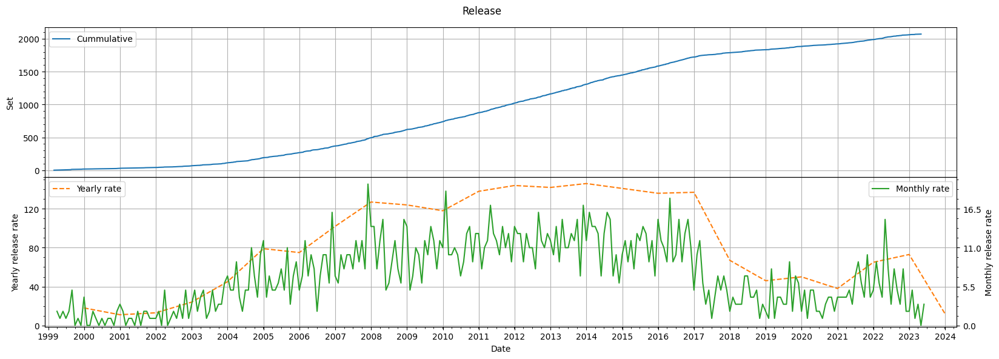

In [44]:
rate_plot(set_by_release)

### By month

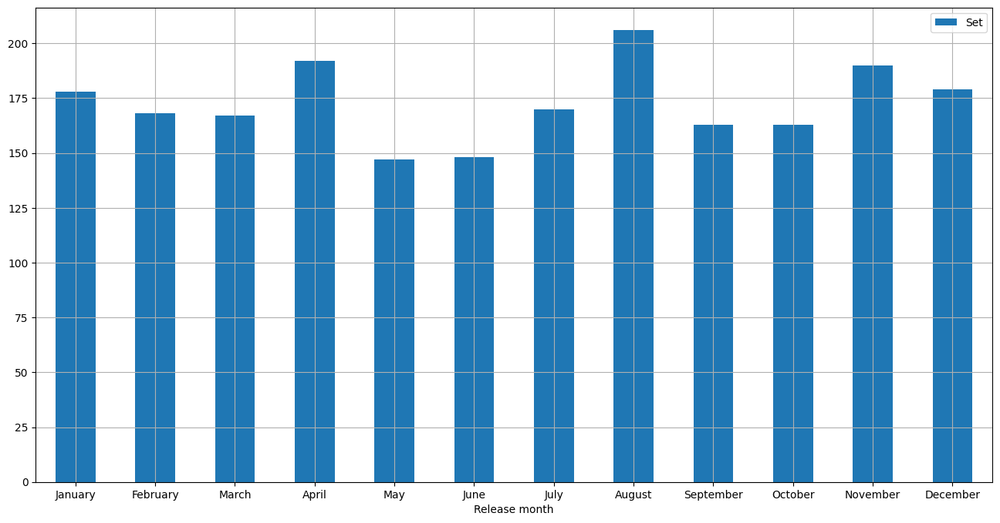

In [45]:
set_by_release.groupby(set_by_release.index.strftime('%B')).sum().sort_index(key=lambda x: pd.to_datetime(x, format='%B').month).plot.bar(figsize= (16,8), grid=True, xlabel = 'Release month', rot = 0)
plt.show()

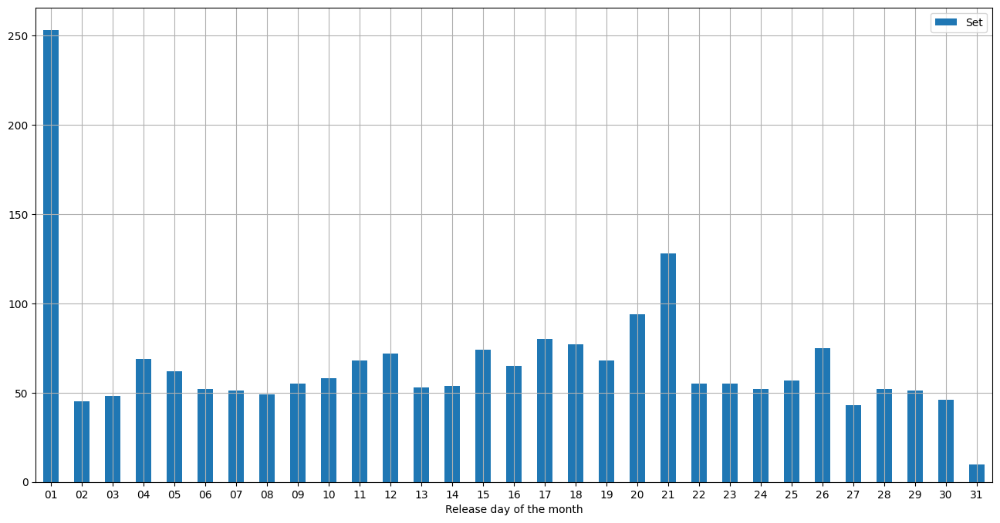

In [46]:
set_by_release.groupby(set_by_release.index.strftime('%d')).sum().plot.bar(figsize= (16,8), grid=True, xlabel = 'Release day of the month', rot = 0)
plt.show()

### By day

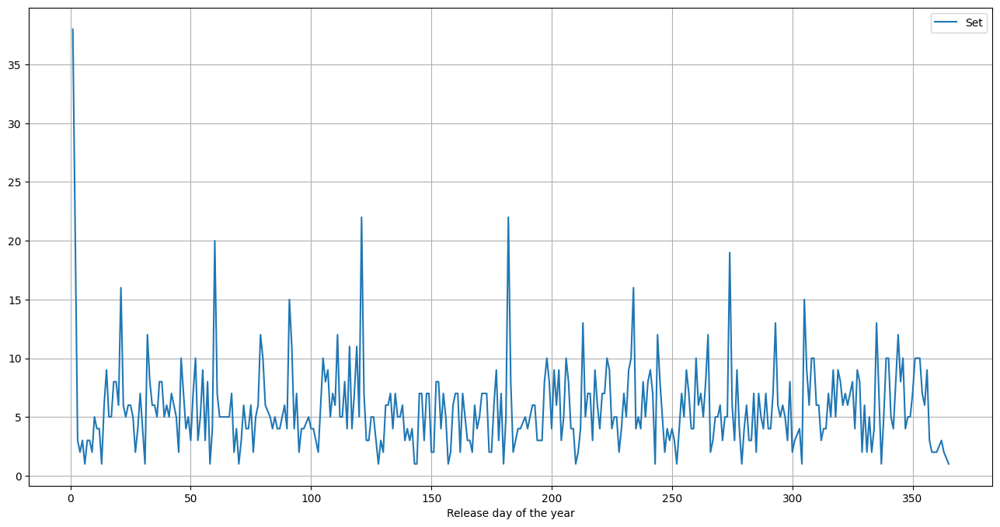

In [47]:
set_by_release.groupby(set_by_release.index.dayofyear).sum().plot(figsize= (16,8), grid=True, xlabel = 'Release day of the year')
plt.show()

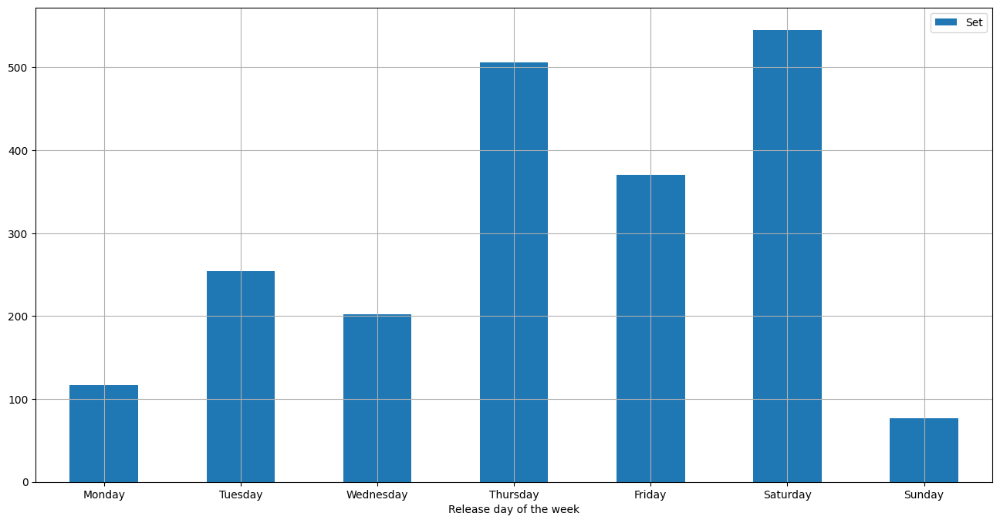

In [48]:
set_by_release_wd = set_by_release.groupby(set_by_release.index.weekday).sum()
set_by_release_wd.index = [calendar.day_name[i] for i in set_by_release_wd.index.astype(int)]
set_by_release_wd.plot.bar(figsize= (16,8), grid=True, xlabel = 'Release day of the week', rot = 0)
plt.show()

### By region

In [49]:
by_release_region = all_set_lists_df.groupby(['Region','Release']).nunique()
by_release_region

Set  Card number  Name  Rarity  Print  Quantity  Series  \
Region Release                                                               
AE     2001-06-04    1            0     2       0      0         0       0   
       2002-08-08    2          100    87       3      0         0       0   
       2002-10-24    1          144   144       5      0         0       1   
       2003-04-17    1            3     3       1      0         0       0   
       2003-06-26    1          105   105       5      0         0       1   
...                ...          ...   ...     ...    ...       ...     ...   
TC     2014-01-29    1           40    40       4      0         2       0   
       2014-05-01    1           20    20       4      0         0       1   
       2015-03-01    2           40    26       1      0         0       0   
       2015-08-29    1          100   100       6      0         0       1   
       2015-12-05    1          100   100       6      0         0       1   

                   Set type  Cover card  Modification date  _merge  
Region Release                                                      
AE     2001-06-04         0           0                  1       1  
       2002-08-08         1           2                  2       1  
       2002-10-24         1           1                  1       1  
       2003-04-17         1           0                  1       1  
       2003-06-26         1           1                  1       1  
...                     ...         ...                ...     ...  
TC     2014-01-29         1           1                  1       1  
       2014-05-01         1           0                  1       1  
       2015-03-01         0           0                  2       1  
       2015-08-29         1           1                  1       1  
       2015-12-05         1           1                  1       1  

[3169 rows x 11 columns]

In [50]:
set_by_release_region = by_release_region['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_region_y = set_by_release_region.groupby(set_by_release_region.index.strftime('%Y')).sum().T
set_by_release_region_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Region,,,,,,,,,,,,,,,,,,,,,
AE,0,0,1,3,4,3,3,5,2,1,...,1,1,0,0,0,0,0,0,0,0
DE,0,0,0,2,8,19,22,17,31,27,...,30,27,28,20,15,13,10,8,7,0
EN,0,0,2,2,3,16,29,48,50,45,...,43,34,35,20,15,13,10,12,11,1
EU,0,0,0,0,2,4,0,0,0,2,...,2,2,1,0,0,0,0,0,0,0
FC,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FR,0,0,0,2,6,18,22,17,31,27,...,28,27,28,19,15,13,10,8,7,0
IT,0,0,0,2,5,18,21,17,31,27,...,28,27,28,20,15,13,10,8,7,0
JA,0,0,0,0,0,0,0,0,0,0,...,3,0,0,0,0,0,0,0,0,0
JP,18,11,10,11,11,20,24,27,33,41,...,43,43,52,14,16,20,14,25,26,9


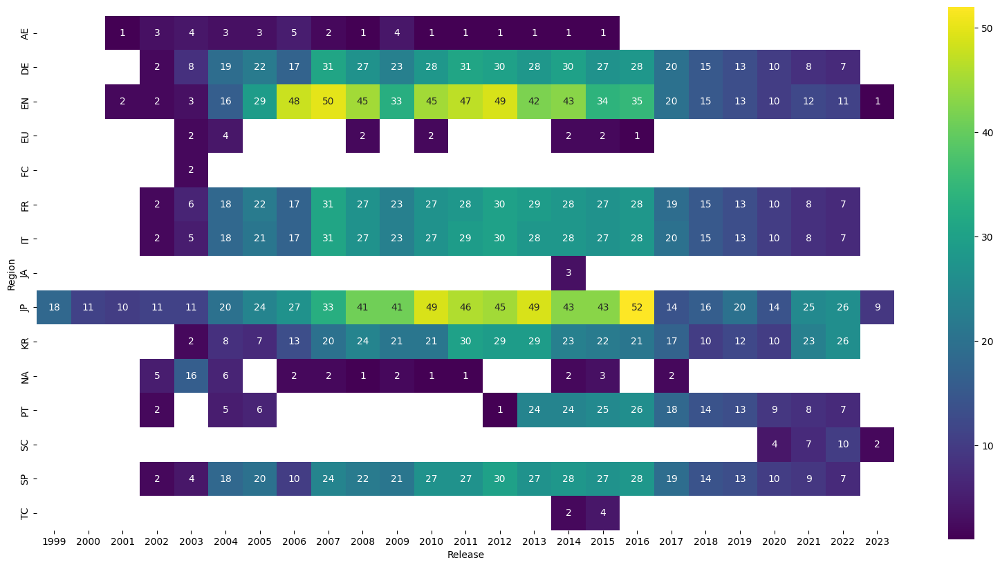

In [51]:
plt.figure(figsize = (20,10))
sns.heatmap(set_by_release_region_y[set_by_release_region_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

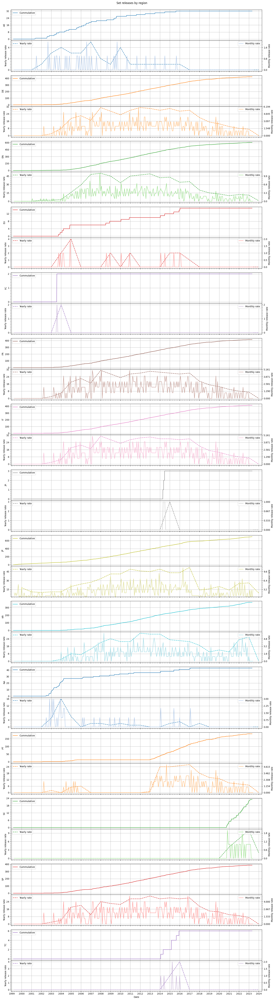

In [52]:
rate_subplots(set_by_release_region, title='Set releases')

### By series

In [53]:
by_release_series = all_set_lists_df.explode('Series').groupby(['Series','Release']).nunique()
by_release_series

Set  Card number  Name  \
Series                                  Release                              
+1 Bonus Pack                           2020-10-31    1           19    19   
                                        2021-02-04    1           20    20   
                                        2021-04-17    1           19    19   
                                        2021-07-17    1           19    19   
                                        2021-07-21    1           19    19   
...                                                 ...          ...   ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01    1            1     1   
                                        2015-10-03    1            1     1   
                                        2015-12-18    1            1     1   
                                        2016-03-01    1            1     1   
                                        2016-09-06    1            1     1   

                                                    Rarity  Print  Quantity  \
Series                                  Release                               
+1 Bonus Pack                           2020-10-31       3      0         0   
                                        2021-02-04       3      0         0   
                                        2021-04-17       3      0         0   
                                        2021-07-17       3      0         0   
                                        2021-07-21       3      0         0   
...                                                    ...    ...       ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01       1      0         0   
                                        2015-10-03       1      0         0   
                                        2015-12-18       1      0         0   
                                        2016-03-01       1      0         0   
                                        2016-09-06       1      0         0   

                                                    Region  Set type  \
Series                                  Release                        
+1 Bonus Pack                           2020-10-31       1         1   
                                        2021-02-04       1         1   
                                        2021-04-17       1         1   
                                        2021-07-17       1         1   
                                        2021-07-21       1         1   
...                                                    ...       ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01       1         1   
                                        2015-10-03       1         1   
                                        2015-12-18       1         1   
                                        2016-03-01       1         1   
                                        2016-09-06       1         1   

                                                    Cover card  \
Series                                  Release                  
+1 Bonus Pack                           2020-10-31           0   
                                        2021-02-04           0   
                                        2021-04-17           0   
                                        2021-07-17           0   
                                        2021-07-21           0   
...                                                        ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01           0   
                                        2015-10-03           0   
                                        2015-12-18           0   
                                        2016-03-01           0   
                                        2016-09-06           0   

                                                    Modification date  _merge  
Series                                  Release                                
+1 Bonus Pack                           2020-10-31   

In [54]:
set_by_release_series = by_release_series['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_series_y = set_by_release_series.groupby(set_by_release_series.index.strftime('%Y')).sum().T
set_by_release_series_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Series,,,,,,,,,,,,,,,,,,,,,
+1 Bonus Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,6,4,0
Animation Chronicle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,2,0
Astral Pack,0,0,0,0,0,0,0,0,0,0,...,8,3,0,0,0,0,0,0,0,0
Attribute Duelist Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,3,4,0
Battle Pack (Rush Duel),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,4,1
Booster (series),0,3,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Booster pack,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Champion Pack,0,0,0,0,0,0,0,1,3,3,...,0,0,0,0,0,0,0,0,0,0
Classic Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,1


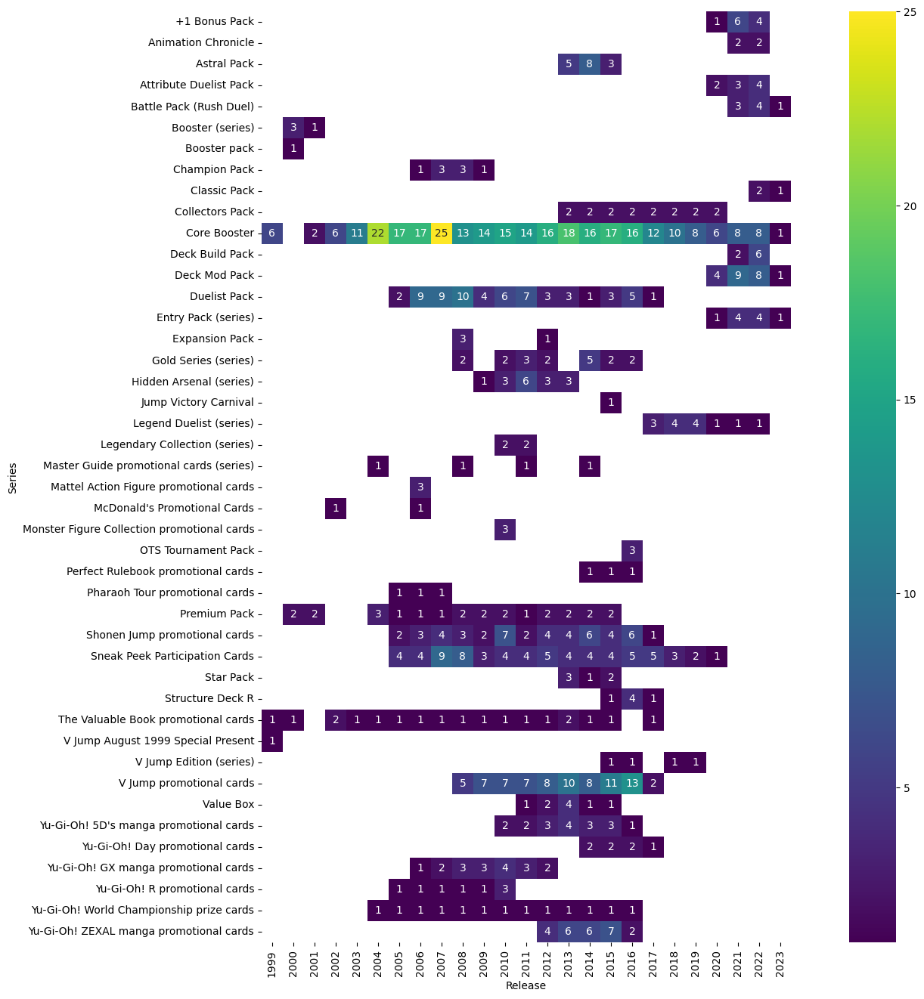

In [55]:
plt.figure(figsize = (20,16))
sns.heatmap(set_by_release_series_y[set_by_release_series_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

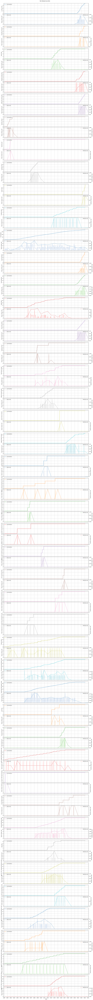

In [56]:
rate_subplots(set_by_release_series, title='Set releases')

### By set type

In [57]:
by_release_type = all_set_lists_df.explode('Set type').groupby(['Set type','Release']).nunique()
by_release_type

Set  Card number  Name  Rarity  \
Set type                     Release                                      
Beta set                     2017-10-04    1          535   106       1   
Binder                       2012-09-21    1            3     3       1   
                             2015-04-29    1            3     3       1   
Book promotional card        2004-12-18    1            2     2       1   
                             2014-04-04    1            1     1       1   
...                                      ...          ...   ...     ...   
Video games promotional card 2011-04-28    1            7     7       1   
                             2011-05-10    1            3     3       1   
                             2013-12-05    1            3     3       1   
                             2014-06-26    1           15     3       1   
                             2016-07-16    1            1     1       1   

                                         Print  Quantity  Region  Series  \
Set type                     Release                                       
Beta set                     2017-10-04      0         2       5       0   
Binder                       2012-09-21      2         0       1       0   
                             2015-04-29      0         0       1       0   
Book promotional card        2004-12-18      0         0       1       0   
                             2014-04-04      0         0       1       1   
...                                        ...       ...     ...     ...   
Video games promotional card 2011-04-28      0         0       1       0   
                             2011-05-10      0         0       1       0   
                             2013-12-05      0         0       1       0   
                             2014-06-26      0         0       5       0   
                             2016-07-16      0         0       1       0   

                                         Cover card  Modification date  _merge  
Set type                     Release                                            
Beta set                     2017-10-04           0                  1       1  
Binder                       2012-09-21           0                  1       1  
                             2015-04-29           0                  1       1  
Book promotional card        2004-12-18           0                  1       1  
                             2014-04-04           0                  1       1  
...                                             ...                ...     ...  
Video games promotional card 2011-04-28           0                  1       1  
                             2011-05-10           0                  1       1  
                             2013-12-05           0                  1       1  
                             2014-06-26           0                  1       1  
                             2016-07-16           0                  1       1  

[1857 rows x 11 columns]

In [58]:
set_by_release_type = by_release_type['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_type_y = set_by_release_type.groupby(set_by_release_type.index.strftime('%Y')).sum().T
set_by_release_type_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Set type,,,,,,,,,,,,,,,,,,,,,
Beta set,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
Binder,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Book promotional card,0,0,0,0,0,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
Book promotional cards,1,2,0,2,1,2,1,1,1,2,...,2,2,1,1,0,0,0,0,0,0
Booster pack,6,6,5,10,15,40,34,36,44,44,...,65,56,52,38,28,31,31,52,53,6
Boss Duel Deck,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Bundle,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Collectible tin,0,0,0,1,2,2,2,3,3,7,...,2,2,2,2,1,2,1,1,1,0
Collector's Set,0,0,0,0,0,0,0,0,0,0,...,0,2,2,0,0,3,2,1,4,0


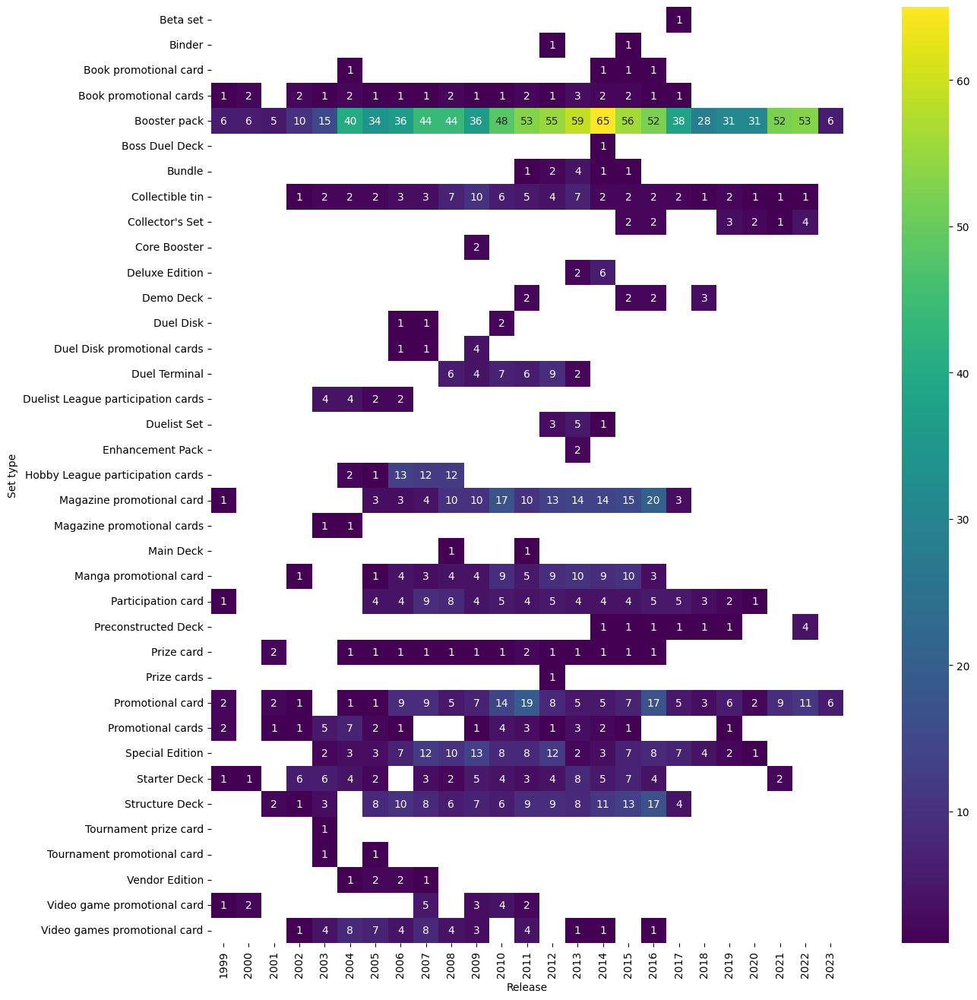

In [59]:
plt.figure(figsize = (20,16))
sns.heatmap(set_by_release_type_y[set_by_release_type_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

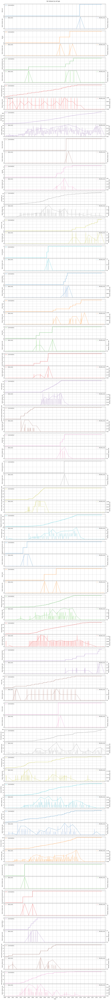

In [60]:
rate_subplots(set_by_release_type, title='Set releases')

# Debug

This section is used for debugging the extraction of data from MediaWiki query responses

## Has nan name/number

In [61]:
all_set_lists_df[all_set_lists_df['Name'].isna() | all_set_lists_df['Card number'].isna()]

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
17,Booster 7,<NA>,Mushroom Man,"(Common,)",<NA>,<NA>,JP,2000-03-01,Booster (series),Booster pack,NaN,2022-07-23 09:59:39,both
18,Booster 7,<NA>,Koumori Dragon,"(Reprint,)",<NA>,<NA>,JP,2000-03-01,Booster (series),Booster pack,NaN,2022-07-23 09:59:39,both
19,Booster 7,<NA>,Jellyfish,"(Common,)",<NA>,<NA>,JP,2000-03-01,Booster (series),Booster pack,NaN,2022-07-23 09:59:39,both
20,Booster 7,<NA>,Grappler,"(Common,)",<NA>,<NA>,JP,2000-03-01,Booster (series),Booster pack,NaN,2022-07-23 09:59:39,both
21,Booster 7,<NA>,Megazowler,"(Common,)",<NA>,<NA>,JP,2000-03-01,Booster (series),Booster pack,NaN,2022-07-23 09:59:39,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
144801,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144802,EX Starter Box,<NA>,Castle Walls,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144803,EX Starter Box,<NA>,Ultimate Offering,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
155818,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only


## Has nan rarity

In [62]:
all_set_lists_df.explode('Rarity')[all_set_lists_df.explode('Rarity')['Rarity'].isna()]['Set'].unique()

array(['Dark Beginning 1', 'Dark Beginning 2', 'Dark Revelation Volume 1',
       'Advanced Tournament Pack 2013 Vol.4', 'Dark Revelation Volume 2',
       'Official Guide Starter Book promotional card',
       'Starter Box pre-order promotional card',
       'Duel Monsters II tournament meeting experience promotional card',
       'The Valuable Book 1 promotional cards',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo Dome participation cards',
       'Jump Festa 2000', 'Advanced Tournament Pack 2016 Vol.1',
       'The Valuable Book character cards',
       'Advanced Event Pack 2013 Vol.2',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo Dome attendance cards',
       'Yu-Gi-Oh! True Duel Monsters: Sealed Memories promotional cards',
       'Advanced Tournament Pack 2013 Vol.3',
       'Advanced Event Pack 2014 Vol.1', 'V Jump April 2013 Tokens',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo D

## Has quantity as print

In [63]:
all_set_lists_df[all_set_lists_df['Print']=='2']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
144752,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144801,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both


In [64]:
all_set_lists_df[all_set_lists_df['Set']=='EX Starter Box']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
144704,EX Starter Box,<NA>,Lord of D.,"(New,)",<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144705,EX Starter Box,<NA>,The Flute of Summoning Dragon,"(New,)",<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144706,EX Starter Box,<NA>,Dark Magician,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144707,EX Starter Box,<NA>,Mystical Elf,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144708,EX Starter Box,<NA>,Feral Imp,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
144799,EX Starter Box,<NA>,Reverse Trap,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144800,EX Starter Box,<NA>,Remove Trap,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144801,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144802,EX Starter Box,<NA>,Castle Walls,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both


## Has nan release

In [65]:
all_set_lists_df[all_set_lists_df['Release'].isna()]['Set'].unique()

array(['Ancient Prophecy Sneak Peek Participation Card',
       'Banzai! promotional cards', 'Cosmo Blazer',
       'Hobby League 7 participation card C',
       'Shonen Jump Vol. 9, Issue 10 promotional card',
       'Starter Deck: Yugi',
       'Invasion: Vengeance Sneak Peek Participation Card',
       'Legacy of the Valiant Sneak Peek Participation Card',
       'Raging Battle Sneak Peek Participation Card',
       "Yu-Gi-Oh! 5D's World Championship 2011: Over the Nexus promotional cards",
       'Astral Pack One', 'Gold Series', 'Premium Pack 2',
       'Shonen Jump Vol. 7, Issue 11 promotional card',
       'Starter Deck: Kaiba Evolution',
       'The New Challengers Sneak Peek Participation Card',
       'The Sanctuary in the Sky', 'Ultimate Edition',
       "Yu-Gi-Oh! 5D's Volume 1 promotional card",
       'Yu-Gi-Oh! Worldwide Edition: Stairway to the Destined Duel promotional cards',
       'Hobby League 6 participation card D', 'Millennium Pack',
       'Shonen Jump May 2006

## Has print as rarity

In [66]:
all_set_lists_df.explode('Rarity')[(all_set_lists_df['Rarity'].explode() == 'New') | (all_set_lists_df['Rarity'].explode() == 'Reprint')]['Set'].unique()

array(['Booster 7', 'Structure Deck R: Machine Dragon Re-Volt',
       'Dark Ceremony Edition', 'Booster 4', 'Booster 5', 'Booster 6',
       'Booster 1', 'EX Starter Box'], dtype=object)

## Merge failed

In [67]:
all_set_lists_df[all_set_lists_df['_merge']=='right_only']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
155818,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only
155819,Structure Deck: Marik (disambiguation),<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2014-07-03 18:52:14,right_only


In [68]:
len(all_set_lists_df[all_set_lists_df['_merge']=='left_only']['Set'].unique())

8

In [69]:
all_set_lists_df['Set'].unique()

array(['Abyss Rising Sneak Peek Participation Card',
       'Academy Duel Disk Osiris Red promotional cards',
       'Ancient Prophecy Sneak Peek Participation Card', ...,
       'Jump Festa 2013 - Promotion Pack A', 'Academia Disk',
       'Structure Deck: Marik (disambiguation)'], dtype=object)

In [70]:
all_set_lists_df[all_set_lists_df['Set'].str.contains("Marik")].dropna()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge


# HTML export

In [ ]:
! jupyter nbconvert Sets.ipynb --output-dir='../' --to=HTML --TagRemovePreprocessor.enabled=True --TagRemovePreprocessor.remove_cell_tags='exclude' --TemplateExporter.exclude_input=True --TemplateExporter.exclude_input_prompt=True --TemplateExporter.exclude_output_prompt=True

# Git

In [ ]:
! git add "../*[Ss]ets*"

In [ ]:
! git commit -m {"'Sets update-" + pd.Timestamp.now().strftime("%d%m%Y")+"'"}

In [ ]:
# ! git push